# EveryBeam LOFAR LBA integration tests

These tests are all setup and explained in `test_installation/everybeam/test_NWA.ipynb`, so check that out first if you haven't already. In short, we'll check we can make images of the LBA primary beam, that the beams interact with Stokes polarisation correctly, and that we can change frequency and time correctly.

Goes without saying, but these tests rely on `everybeam` being installed.

In [1]:
from subprocess import call
from astropy.io import fits
import numpy as np
from astropy.table import Column, Table
from astropy.time import Time
from astropy.coordinates import SkyCoord
from astropy.coordinates import EarthLocation
from astropy import units as u
import matplotlib.pyplot as plt
import numpy.testing as npt
from astropy.constants import c
from astropy.wcs import WCS
import erfa

##A bunch of test and plotting code lives here so we can use it in multile notebooks
from wodenpy.primary_beam.use_everybeam import run_everybeam, run_everybeam_over_threads
##A bunch of test and plotting code lives here so we can use it in multile notebooks
from eb_testing_code import create_WCS, plot_jones_on_sky, plot_everybeam_on_sky, make_sky_models, read_uvfits, convert_inst_to_stokes, test_stokes_recovery, getFDF, findpeaks, test_RM_recovery, make_RM_skymodel

from wodenpy.array_layout.precession import RTS_Precess_LST_Lat_to_J2000

C = c.to('m/s').value

ra0 = 0
dec0 = 53

lofar_lat = 52.905329712
lofar_long = 6.867996528

##pick a time/date that sticks our phase centre overhead
date = "2024-07-21T03:35:00"
##Assume that the OSKAR telescope is near the MWA??
lofar_location = EarthLocation(lat=lofar_lat*u.deg, 
                               lon=lofar_long*u.deg)

observing_time = Time(date, scale='utc', location=lofar_location)

##Grab the LST
LST = observing_time.sidereal_time('mean')
LST_deg = LST.value*15
print(f"LST: {LST_deg} deg, RA: {ra0}")

LST: 0.01862197128531748 deg, RA: 0


OK, so the most efficient way I've found of calling EveryBeam for LOFAR does not allow you to directly control the beam pointing. Instead, you have to edit the underlying Measurement Set (MS) to change the pointing. So we'll do that now.

In [2]:
from wodenpy.primary_beam.use_everybeam import create_filtered_ms

create_filtered_ms("lba.MS", "pointed_LBA.ms", np.radians(ra0), np.radians(dec0))

ms_path = "pointed_LBA.ms"

Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful read/write open of default-locked table pointed_LBA.ms::FIELD: 10 columns, 1 rows
(1, 1, 2)


## Image the beam on the sky

First up, let's see if we can just plot a LOFAR station beam to check it looks sensible.

Thread 0 processing coords 0 to 1250Thread 1 processing coords 1250 to 2500

Thread 3 processing coords 3750 to 5000Thread 2 processing coords 2500 to 3750

Thread 5 processing coords 6250 to 7500Thread 4 processing coords 5000 to 6250

Thread 7 processing coords 8750 to 10000Thread 6 processing coords 7500 to 8750



2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


Thread 0 finished
Thread 2 finished
Thread 5 finishedThread 7 finished

Thread 1 finished
Thread 4 finished
Thread 3 finished
Thread 6 finished


2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:34:31	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


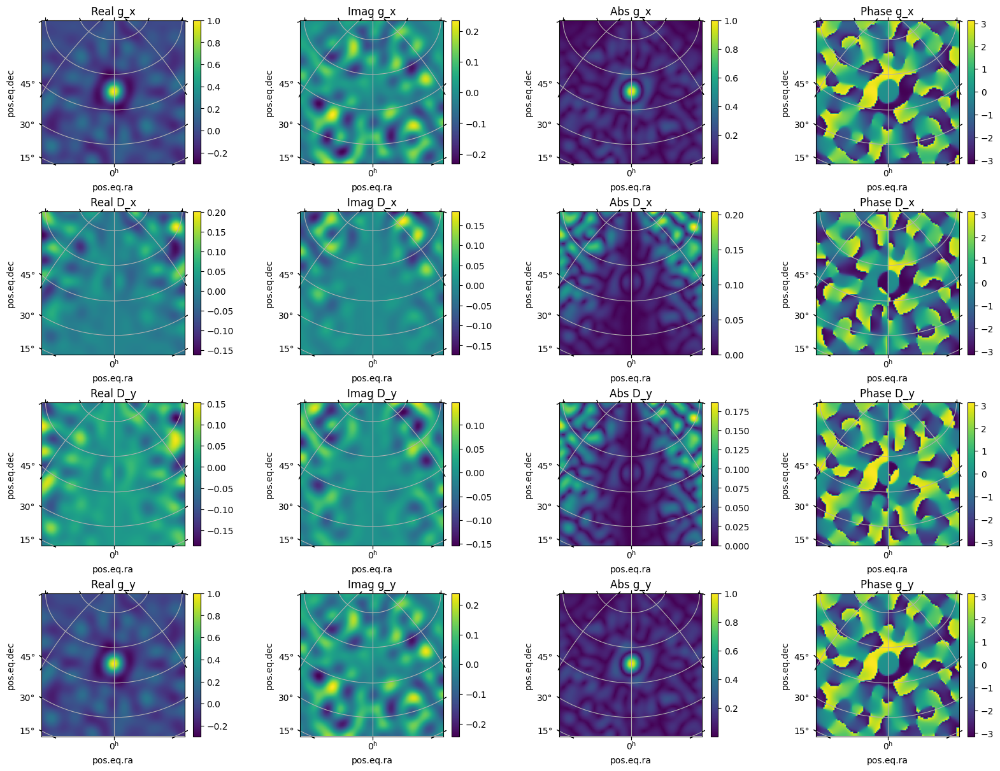

In [3]:
##setup coords
nside = 100
radec_reso = 60 / nside
header, wcs = create_WCS(ra0, dec0, nside, radec_reso)
x_mesh, y_mesh = np.meshgrid(np.arange(nside), np.arange(nside))
ras, decs = wcs.all_pix2world(x_mesh, y_mesh, 0)
ras = np.radians(ras.flatten())
decs = np.radians(decs.flatten())

freq = 50e+6
station_id = 0

##Technically we don't need to do this here, but in WODEN proper, we
##precess the array back to J2000 rather than precessing the sky forward
##So doing it here to show you what is happening under the hood
mjd_current = observing_time.mjd
lst_J2000, latitude_J2000 = RTS_Precess_LST_Lat_to_J2000(np.radians(LST_deg),
                                                         np.radians(lofar_lat),
                                                         mjd_current)

##Stick all our variables in lists as `run_everybeam` is designed to be
## run over multiple times/frequencies
j2000_latitudes = [latitude_J2000]
j2000_lsts = [lst_J2000]
times = [observing_time]
freqs = [freq]
station_ids = [0]
##Everybeam doesn't need a coeff path for this beam
coeff_path=""

##We'll run EveryBeam in parallel to speed things up
num_threads=8

all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            times, freqs, station_ids,
                            apply_beam_norms=True,
                            iau_order=True,
                            parallactic_rotate=True)

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

This looks decent, gains look way stronger than the leakages because I've set up the `run_everybeam` function to do a normalistion towards the beam phase centre. However, these beams aren't aligned north-east and south-west as the dipoles are different in a LOFAR station.

## Off cardinal dipoles

This brings up a need for new functionality in `WODEN` to handle 45/135 deg dipoles. As noted in Table 4.1 of TMS, the combinations of Stokes IQUV parameters measured by each instrumental polarisation are different as compared to 0/90 deg dipoles. This means we need a different mixing matrix. If we label the 45/135 deg dipoles as p and q, then the instrumental visibilities are:

$$
\begin{bmatrix}
\mathrm{V}_{pp} \\
\mathrm{V}_{pq} \\
\mathrm{V}_{qp} \\
\mathrm{V}_{qq} \\
\end{bmatrix}
=
\begin{bmatrix}
1 & 0 & 1 & 0 \\
0 & -1 & 0 & j \\
0 & -1 & 0 & -j \\
1 & 0 & -1 & 0 \\
\end{bmatrix}
\begin{bmatrix}
\mathrm{V}_I \\
\mathrm{V}_Q \\
\mathrm{V}_U \\
\mathrm{V}_V \\
\end{bmatrix}
$$

<!-- ```
\mathrm{V}_I = 0.5 * (\mathrm{V}_pp + \mathrm{V}_qq)
\mathrm{V}_Q = 0.5 * (\mathrm{V}_pp - \mathrm{V}_qq)
\mathrm{V}_U = 0.5 * (\mathrm{V}_pq + \mathrm{V}_qp)
\mathrm{V}_V = 0.5j * (\mathrm{V}_pq - \mathrm{V}_qp)
``` -->

If we then say the beam Jones matrix is:

$$
\mathbf{J} =
\begin{bmatrix}
g_p & D_p \\
D_q & g_q \\
\end{bmatrix}
$$


then the measured visibilities between antennas 1 and 2 are:

$$
   \begin{bmatrix}
   \mathrm{V}_{12\,pp} \\
   \mathrm{V}_{12\,pq} \\
   \mathrm{V}_{12\,qp} \\
   \mathrm{V}_{12\,qq} \\
   \end{bmatrix} =
   \mathbf{J}_1 \otimes \mathbf{J}_2^*
   \begin{bmatrix}
    1 & 0 & 1 & 0 \\
    0 & -1 & 0 & i \\
    0 & -1 & 0 & -i \\
    1 & 0 & -1 & 0 \\
   \end{bmatrix}
   \begin{bmatrix}
   \mathrm{V}_{12\,I} \\
   \mathrm{V}_{12\,Q} \\
   \mathrm{V}_{12\,U} \\
   \mathrm{V}_{12\,V}
   \end{bmatrix}
$$


$$=
   \begin{bmatrix}
   g_{1p} g_{2p}^* & g_{1p} D_{2p}^* & D_{1p} g_{2p}^* & D_{1p} D_{2p}^* \\
   g_{1p} D_{2q}^* & g_{1p} g_{2q}^* & D_{1p} D_{2q}^* & D_{1p} g_{2q}^* \\
   D_{1q} g_{2p}^* & D_{1q} D_{2p}^* & g_{1q} g_{2p}^* & g_{1q} D_{2p}^* \\
   D_{1q} D_{2q}^* & D_{1q} g_{2q}^* & g_{1q} D_{2q}^* & g_{1q} g_{2q}^*
   \end{bmatrix}
   \begin{bmatrix}
    1 & 0 & 1 & 0 \\
    0 & -1 & 0 & i \\
    0 & -1 & 0 & -i \\
    1 & 0 & -1 & 0 \\
   \end{bmatrix}
   \begin{bmatrix}
   \mathrm{V}_{12\,I} \\
   \mathrm{V}_{12\,Q} \\
   \mathrm{V}_{12\,U} \\
   \mathrm{V}_{12\,V}
   \end{bmatrix}
$$



$$=
   \begin{bmatrix}
   g_{1p} g_{2p}^* + D_{1p} D_{2p}^* & -g_{1p} D_{2p}^* - D_{1p} g_{2p}^* & g_{1p} g_{2p}^* - D_{1p} D_{2p}^* & i(g_{1p} D_{2p}^* -D_{1p} g_{2p}^*) \\
   g_{1p} D_{2q}^* + D_{1p} g_{2q}^* & -g_{1p} g_{2q}^* - D_{1p} D_{2q}^*  &  g_{1p} D_{2q}^* - D_{1p} g_{2q}^* & i(g_{1p} g_{2q}^* -D_{1p} D_{2q}^*)  \\
   D_{1q} g_{2p}^* + g_{1q} D_{2p}^* & -D_{1q} D_{2p}^* - g_{1q} g_{2p}^* & D_{1q} g_{2p}^* - g_{1q} D_{2p}^* & i(D_{1q} D_{2p}^* -g_{1q} g_{2p}^*) \\
   D_{1q} D_{2q}^* + g_{1q} g_{2q}^*  & -D_{1q} g_{2q}^* - g_{1q} D_{2q}^*  & D_{1q} D_{2q}^* - g_{1q} g_{2q}^* & i(D_{1q} g_{2q}^* -g_{1q} D_{2q}^*)  \\
   \end{bmatrix}
   \begin{bmatrix}
   \mathrm{V}_{12\,I} \\
   \mathrm{V}_{12\,Q} \\
   \mathrm{V}_{12\,U} \\
   \mathrm{V}_{12\,V}
   \end{bmatrix}
$$

$$
\begin{align*}
\mathrm{V}_{12\,pp} = (g_{1p} g_{2p}^* + D_{1p} D_{2p}^*)\mathrm{V}_{12\,I} - (g_{1p} D_{2p}^* + D_{1p} g_{2p}^*)\mathrm{V}_{12\,Q} \\+ (g_{1p} g_{2p}^* - D_{1p} D_{2p}^*)\mathrm{V}_{12\,U} + i(g_{1p} D_{2p}^* - D_{1p} g_{2p}^*)\mathrm{V}_{12\,V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{12\,pq} = (g_{1p} D_{2q}^* + D_{1p} g_{2q}^*)\mathrm{V}_{12\,I} - (g_{1p} g_{2q}^* + D_{1p} D_{2q}^*)\mathrm{V}_{12\,Q} \\+ (g_{1p} D_{2q}^* - D_{1p} g_{2q}^*)\mathrm{V}_{12\,U} + i(g_{1p} g_{2q}^* -D_{1p} D_{2q}^*)\mathrm{V}_{12\,V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{12\,qp} = (D_{1q} g_{2p}^* + g_{1q} D_{2p}^*)\mathrm{V}_{12\,I} - (D_{1q} D_{2p}^* + g_{1q} g_{2p}^*)\mathrm{V}_{12\,Q} \\+ (D_{1q} g_{2p}^* - g_{1q} D_{2p}^*)\mathrm{V}_{12\,U} + i(D_{1q} D_{2p}^* -g_{1q} g_{2p}^*)\mathrm{V}_{12\,V} 
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{12\,qq} = (D_{1q} D_{2q}^* + g_{1q} g_{2q}^*)\mathrm{V}_{12\,I}  - (D_{1q} g_{2q}^* + g_{1q} D_{2q}^*)\mathrm{V}_{12\,Q}  \\+ (D_{1q} D_{2q}^* - g_{1q} g_{2q}^*)\mathrm{V}_{12\,U} + i(D_{1q} g_{2q}^* -g_{1q} D_{2q}^*)\mathrm{V}_{12\,V} 
\end{align*}
$$




Repeating the whole process but ignoring the beam, we see that

$$
\begin{align*}
\mathrm{V}_{pp} = \mathrm{V}_{I} + \mathrm{V}_{U}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{pq} = -\mathrm{V}_{Q} + i\mathrm{V}_{V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{qp} = -\mathrm{V}_{Q} - i\mathrm{V}_{V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{qq} = \mathrm{V}_{I} - \mathrm{V}_{U}
\end{align*}
$$

Rearranging this we see to recover Stokes IQUV visibilities, we obviously need a different set of equations compared to 0/90 deg dipoles. These are

$$
\begin{align*}
\mathrm{V}_{I} = \frac{\mathrm{V}_{pp} + \mathrm{V}_{qq}}{2}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{Q} = -\frac{\mathrm{V}_{pq} + \mathrm{V}_{qp}}{2}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{U} = \frac{\mathrm{V}_{pp} - \mathrm{V}_{qq}}{2}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{V} = \frac{\mathrm{V}_{qp} - \mathrm{V}_{pq}}{2i}
\end{align*}
$$


This maths has been added to `WODEN`. Loading a `LOFAR` beam model should trigger the correct mixing matrix to be used, but there is also a `--off_cardinal_dipoles` flag that can be set to force the use of the off cardinal mixing matrix.

## Stokes recovery with off cardinal dipoles
Let's try to recover single point source of either Stokes I, Q, U or V. First of all, we'll do it without any primary beam effects, to check the mixing matrix. We'll then add the primary beam effects and see how it affects the recovery.

In [ ]:
make_sky_models(ra0, dec0)

freq_reso = 1e+6
low_freq = 100e+6
high_freq = 150e+6

num_freq_chans = int((high_freq - low_freq) / freq_reso)

primary_beam = "none"

for pol in ['I', 'Q', 'U', 'V']:
# for pol in ['I']:

    uvfits_name = f"stokes{pol}_{primary_beam}"
    cat_name = f'{pol}_source.fits'
    
    cmd = "run_woden.py "
    
    ##The command to run WODEN
    cmd += f'--ra0={ra0} '
    cmd += f'--dec0={dec0} '
    cmd += f'--latitude={lofar_lat} '
    cmd += f'--longitude={lofar_long} '
    cmd += f'--date={date} '
    cmd += f'--output_uvfits_prepend={uvfits_name} '
    cmd += f'--cat_filename={cat_name} '
    cmd += f'--primary_beam={primary_beam} '
    cmd += f'--lowest_channel_freq={low_freq} '
    cmd += f'--freq_res={freq_reso} '
    cmd += f'--num_freq_channels={num_freq_chans} '
    cmd += f'--band_nums=1 '
    cmd += f'--time_res=2 '
    cmd += f'--num_time_steps=1 '
    cmd += f'--IAU_order '
    cmd += f'--off_cardinal_dipoles '
    cmd += '--num_threads=1 '
    cmd += f'--beam_ms_path=pointed_LBA.ms '

    call(cmd, shell=True)

/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:36:05 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:36:05

/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:36:07 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:36:07

/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:36:10 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:36:10

/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:36:12 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:36:12

In [6]:
for pol in ['I', 'Q', 'U', 'V']:
    uvfits_name = f"stokes{pol}_none"
    XX, XY, YX, YY = read_uvfits(f'{uvfits_name}_band01.uvfits')
    
    ##on_cardinal=False means we're using the maths above to recombine the
    ##XX, XY, YX, YY into Stokes I, Q, U, V
    test_stokes_recovery(pol, 'none', atol=5e-2, on_cardinal=False)
    
    # ##uncomment to print out the exact values recovered
    # ##pick a random baseline to print, they should all be the sam
    # baseline = 0
    # ##Supply on_cardinal=False to use the right maths
    # recover_I, recover_Q, recover_U, recover_V = convert_inst_to_stokes(XX[baseline], XY[baseline], YX[baseline], YY[baseline],
    #                                             on_cardinal=False)
    
    # print(f"Input {pol}, Recover I {recover_I[0].real:.2f}, Q {recover_Q[0].real:.2f}, U {recover_U[0].real:.2f}, V {recover_V[0].real:.2f}")

Testing Stokes I
Stokes I passed
Testing Stokes Q
Stokes Q passed
Testing Stokes U
Stokes U passed
Testing Stokes V
Stokes V passed


Sweeeeet, works in the case of no primary beam. How about when we add the `LOFAR` primary beam?

In [ ]:
make_sky_models(ra0, dec0)

freq_reso=1e+6
low_freq=100e+6
high_freq = 150e+6
num_freq_chans = int((high_freq - low_freq) / freq_reso)
primary_beam = "everybeam_LOFAR"

for pol in ['I', 'Q', 'U', 'V']:

    uvfits_name = f"stokes{pol}_{primary_beam}"
    cat_name = f'{pol}_source.fits'
    
    cmd = "run_woden.py "
    
    ##The command to run WODEN
    cmd += f'--ra0={ra0} '
    cmd += f'--dec0={dec0} '
    cmd += f'--latitude={lofar_lat} '
    cmd += f'--longitude={lofar_long} '
    cmd += f'--date={date} '
    cmd += f'--output_uvfits_prepend={uvfits_name} '
    cmd += f'--cat_filename={cat_name} '
    cmd += f'--primary_beam={primary_beam} '
    cmd += f'--lowest_channel_freq={low_freq} '
    cmd += f'--freq_res={freq_reso} '
    cmd += f'--num_freq_channels={num_freq_chans} '
    cmd += f'--band_nums=1 '
    cmd += f'--time_res=2 '
    cmd += f'--num_time_steps=1 '
    cmd += f'--IAU_order '
    cmd += f'--off_cardinal_dipoles '
    cmd += '--num_threads=1 '
    cmd += f'--beam_ms_path=pointed_LBA.ms '

    call(cmd, shell=True)

/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:36:53 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:36:53

2025-02-27 01:36:55	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:36:55	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:36:55	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


2025-02-27 11:36:55 - INFO - Sky set 0 has returned from the GPU after 0.3 seconds
2025-02-27 11:36:55 - INFO - Have completed 1 of 1 components calcs (100.0%)
2025-02-27 11:36:55 - INFO - Finished all rounds of processing
2025-02-27 11:36:55 - INFO - Full run took 0:00:01.540169
2025-02-27 11:36:55 - INFO - WODEN is done. Closing logging handlers. S'later


/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:36:56 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:36:56

2025-02-27 01:36:58	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:36:58	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:36:58	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


2025-02-27 11:36:57 - INFO - Sky set 0 has returned from the GPU after 0.3 seconds
2025-02-27 11:36:57 - INFO - Have completed 1 of 1 components calcs (100.0%)
2025-02-27 11:36:57 - INFO - Finished all rounds of processing
2025-02-27 11:36:57 - INFO - Full run took 0:00:01.524568
2025-02-27 11:36:57 - INFO - WODEN is done. Closing logging handlers. S'later


/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:36:58 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:36:58

2025-02-27 01:37:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:37:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:37:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


2025-02-27 11:37:00 - INFO - Sky set 0 has returned from the GPU after 0.3 seconds
2025-02-27 11:37:00 - INFO - Have completed 1 of 1 components calcs (100.0%)
2025-02-27 11:37:00 - INFO - Finished all rounds of processing
2025-02-27 11:37:00 - INFO - Full run took 0:00:01.622305
2025-02-27 11:37:00 - INFO - WODEN is done. Closing logging handlers. S'later


/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:37:01 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:37:01

2025-02-27 01:37:02	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:37:02	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:37:02	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


2025-02-27 11:37:02 - INFO - Sky set 0 has returned from the GPU after 0.3 seconds
2025-02-27 11:37:02 - INFO - Have completed 1 of 1 components calcs (100.0%)
2025-02-27 11:37:02 - INFO - Finished all rounds of processing
2025-02-27 11:37:02 - INFO - Full run took 0:00:01.506369
2025-02-27 11:37:02 - INFO - WODEN is done. Closing logging handlers. S'later


In [8]:
for pol in ['I', 'Q', 'U', 'V']:
    uvfits_name = f"stokes{pol}_everybeam_LOFAR"
    XX, XY, YX, YY = read_uvfits(f'{uvfits_name}_band01.uvfits')
    
    ##on_cardinal=False means we're using the maths above to recombine the
    ##XX, XY, YX, YY into Stokes I, Q, U, V
    test_stokes_recovery(pol, 'none', atol=5e-2, on_cardinal=False)
    
    # ##uncomment to print out the exact values recovered
    # ##pick a random baseline to print, they should all be the sam
    # baseline = 0
    # ##Supply on_cardinal=False to use the right maths
    # recover_I, recover_Q, recover_U, recover_V = convert_inst_to_stokes(XX[baseline], XY[baseline], YX[baseline], YY[baseline],
    #                                             on_cardinal=False)
    
    # print(f"Input {pol}, Recover I {recover_I[0].real:.2f}, Q {recover_Q[0].real:.2f}, U {recover_U[0].real:.2f}, V {recover_V[0].real:.2f}")

Testing Stokes I
Stokes I passed
Testing Stokes Q
Stokes Q passed
Testing Stokes U
Stokes U passed
Testing Stokes V
Stokes V passed


Booya, works perfectly. Now to test the RM recovery.

## RM recovery

In [ ]:
phi_RM, pol_frac = make_RM_skymodel(ra0, dec0)

freq_reso = 0.1e+6
low_freq = 100e+6
high_freq = 130e+6
num_freq_chans = int((high_freq - low_freq) / freq_reso)


primary_beam = "everybeam_LOFAR"

uvfits_name = f"rm_source_{primary_beam}"
cat_name = 'RM_source.fits'

##The command to run WODEN
command = f'run_woden.py --ra0={ra0} --dec0={dec0} '
command += f'--date={date} --output_uvfits_prepend={uvfits_name} '
command += f'--latitude={lofar_lat} --longitude={lofar_long} '
command += f'--cat_filename={cat_name} --primary_beam={primary_beam} '
command += f'--lowest_channel_freq={low_freq} --freq_res={freq_reso} '
command += f'--num_freq_channels={num_freq_chans} --band_nums=1 '
command += f'--time_res=2 --num_time_steps=1 --IAU_order --num_threads=1 '
command += f' --station_id=0 '
command += f'--beam_ms_path=pointed_LBA.ms'

call(command, shell=True)

/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:37:11 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:37:11

2025-02-27 01:37:13	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:37:13	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:37:13	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


2025-02-27 11:37:13 - INFO - Sky set 0 has returned from the GPU after 0.2 seconds
2025-02-27 11:37:13 - INFO - Have completed 1 of 1 components calcs (100.0%)
2025-02-27 11:37:13 - INFO - Finished all rounds of processing
2025-02-27 11:37:13 - INFO - Full run took 0:00:01.572006
2025-02-27 11:37:13 - INFO - WODEN is done. Closing logging handlers. S'later


0

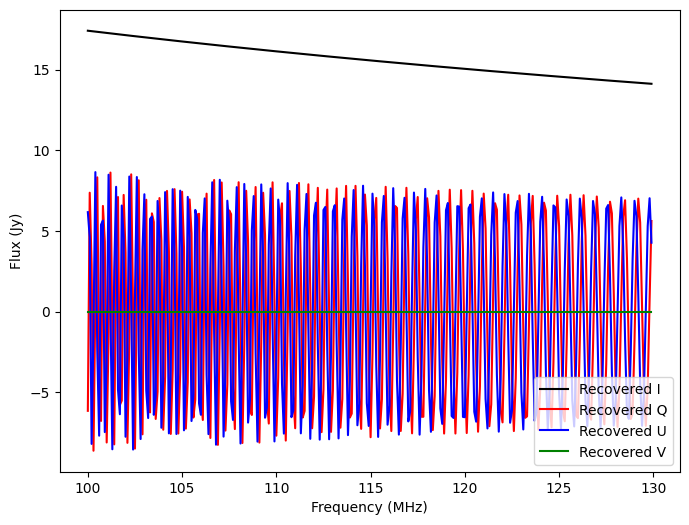

In [10]:
XX, XY, YX, YY = read_uvfits('rm_source_everybeam_LOFAR_band01.uvfits')
baseline = 0    
recover_I, recover_Q, recover_U, recover_V = convert_inst_to_stokes(XX[baseline], XY[baseline], YX[baseline], YY[baseline],
                                                                    on_cardinal=False)

    
freqs = np.arange(low_freq, high_freq, freq_reso)

fig, axs = plt.subplots(1, 1, figsize=(8, 6))

axs.plot(freqs / 1e+6, recover_I.real, 'k-', label='Recovered I')
axs.plot(freqs / 1e+6, recover_Q.real, 'r', label='Recovered Q')
axs.plot(freqs / 1e+6, recover_U.real, 'b', label='Recovered U')
axs.plot(freqs / 1e+6, recover_V.real, 'g', label='Recovered V')

axs.legend()

axs.set_xlabel('Frequency (MHz)')
axs.set_ylabel('Flux (Jy)')

plt.show()

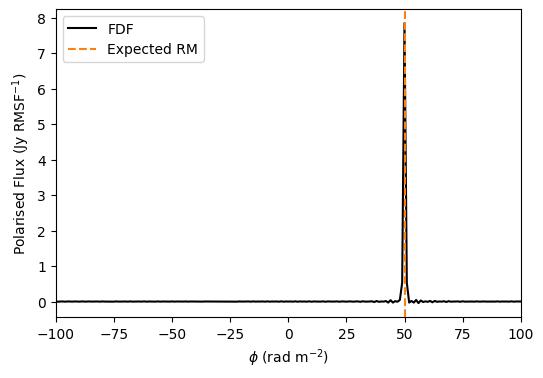

Recovered RM: 50.0 Expected RM: 50
Recovered Pol. Fraction: 0.5 Expected Pol Fraction 0.5


In [11]:
test_RM_recovery(uvfits_name, phi_RM, pol_frac, freqs, atol=0.02)

Looks good.

## Test unique primary beam per station

`run_everybeam` (which is called by `run_everybeam_over_threads`) has been setup to run any given number of stations, times, frequencies and directions. Here we'll test things are returned in the expecting order by running two times and two frequencies. As waiting around is boring, we'll also run things across multiple threads; this is a mircocosm of what happens in `run_woden.py`, as we split the sky model reading and beam calculations across threads. 

In [12]:
from astropy.time import TimeDelta
from wodenpy.primary_beam.use_everybeam import get_num_stations

##Setup a grid of RA/Dec on the sky
nside=100
radec_reso = 100/nside

##lock frame to first LST, so we can see if beam is locked to RA/Dec
header, wcs = create_WCS(LST_deg, dec0, nside, radec_reso)
x_mesh, y_mesh = np.meshgrid(np.arange(nside), np.arange(nside))
ras, decs = wcs.all_pix2world(x_mesh, y_mesh, 0)

ras = np.radians(ras.flatten())
decs = np.radians(decs.flatten())

num_comps = len(ras)
num_beams = get_num_stations(ms_path)

##Do a couple of frequencies to check mapping is working
all_freqs = np.array([50e+6, 100e+6])

##Do two times, 4 hours apart to check things move on the sky
##Our obs frame is locked to beam phase, so should still be centred, but it'll
##be elongated due to projection effects/pointing
all_times = np.array([observing_time, observing_time + TimeDelta(4*3600, format='sec')])

station_ids = np.arange(num_beams)

num_threads=8

j2000_latitudes = []
j2000_lsts = []

for time in all_times:
    LST_deg = time.sidereal_time('mean').value*15

    mjd_current = time.mjd
    lst_J2000, latitude_J2000 = RTS_Precess_LST_Lat_to_J2000(np.radians(LST_deg),
                                                         np.radians(lofar_lat),
                                                         mjd_current)
    j2000_latitudes.append(latitude_J2000)
    j2000_lsts.append(lst_J2000)

##Everybeam doesn't need a coeff path for this beam
coeff_path=""

##We'll run EveryBeam in parallel to speed things up
num_threads=8

all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            all_times, all_freqs, station_ids,
                            apply_beam_norms=True,
                            iau_order=True,
                            parallactic_rotate=True)

Successful readonly open of default-locked table pointed_LBA.ms/ANTENNA: 10 columns, 37 rows


Thread 0 processing coords 0 to 1250Thread 2 processing coords 2500 to 3750Thread 1 processing coords 1250 to 2500
Thread 4 processing coords 5000 to 6250
Thread 3 processing coords 3750 to 5000
Thread 5 processing coords 6250 to 7500Thread 6 processing coords 7500 to 8750



Thread 7 processing coords 8750 to 10000


2025-02-27 01:44:07	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:44:07	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:44:07	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.
2025-02-27 01:44:07	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:44:07	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:44:07	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


Thread 4 finished
Thread 1 finished
Thread 5 finished
Thread 6 finished
Thread 2 finished
Thread 3 finished
Thread 7 finished
Thread 0 finished


OK, now setup code to plot the the absolute values of the first polarisation for the first 36 stations, per time, per freq, to check our outputs.

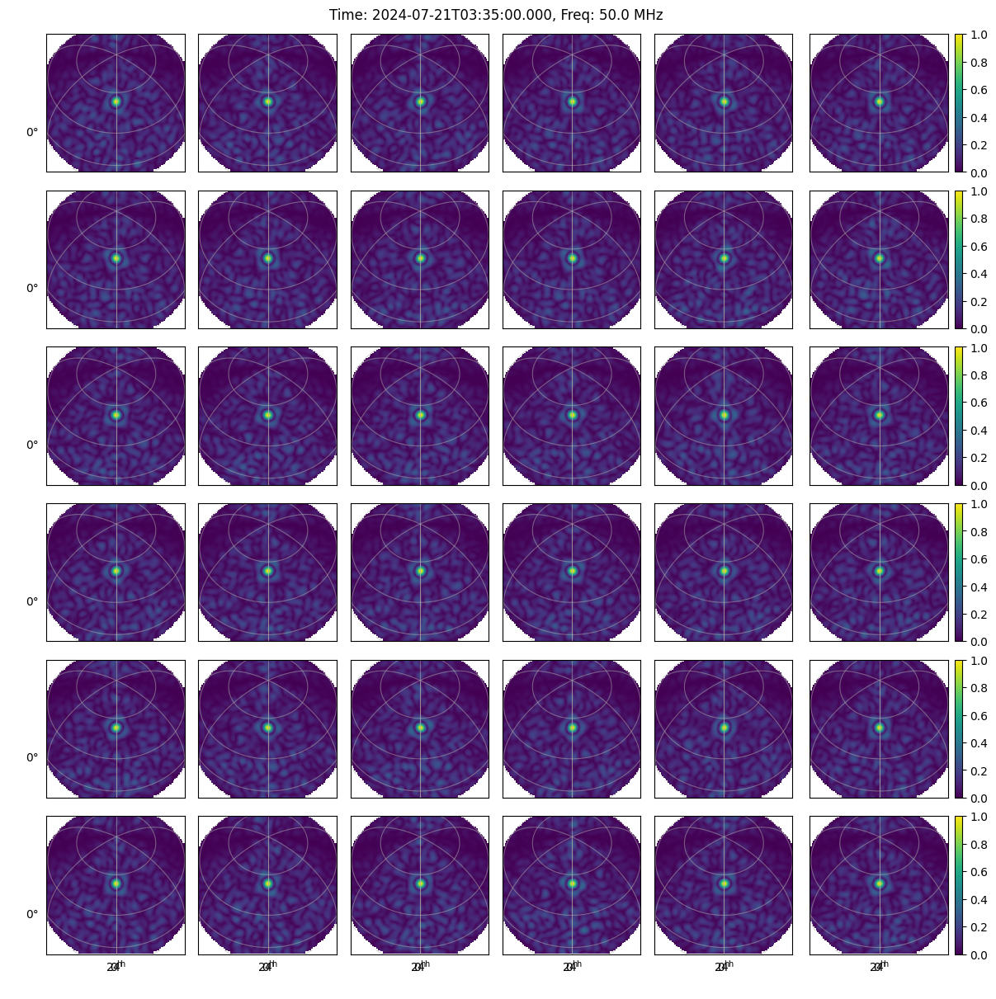

In [13]:
def plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs):
    fig, axs = plt.subplots(6, 6, figsize=(12, 12), layout='constrained',
                            subplot_kw={'projection': wcs})
    
    for col in range(6):
        for row in range(6):
            beam_ind = col*6 + row
            
            gx = all_jones[beam_ind, time_ind, freq_ind, :, 0,0]
            gx.shape = (nside, nside)
            
            im = axs[row, col].imshow(np.abs(gx), origin='lower', vmax=1, vmin=0)
            
            axs[row, col].grid(alpha=0.5)
            
            lon = axs[row, col].coords[0]
            lat = axs[row, col].coords[1]
            
            lon.set_ticks_visible(False)
            lat.set_ticks_visible(False)
            lon.set_axislabel(' ')
            lat.set_axislabel(' ')
            
            
            if col > 0:
                lat.set_ticklabel_visible(False)
            if row < 5:
                lon.set_ticklabel_visible(False)
                
            if col == 5:
                plt.colorbar(im, ax=axs[row, col])
            

    fig.suptitle(f"Time: {all_times[time_ind].isot}, Freq: {all_freqs[freq_ind]/1e+6} MHz")

    plt.show()

time_ind = 0
freq_ind = 0
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

Cool, we get a different primary beam shape for each station, they're all normalised to 1. So far so good.

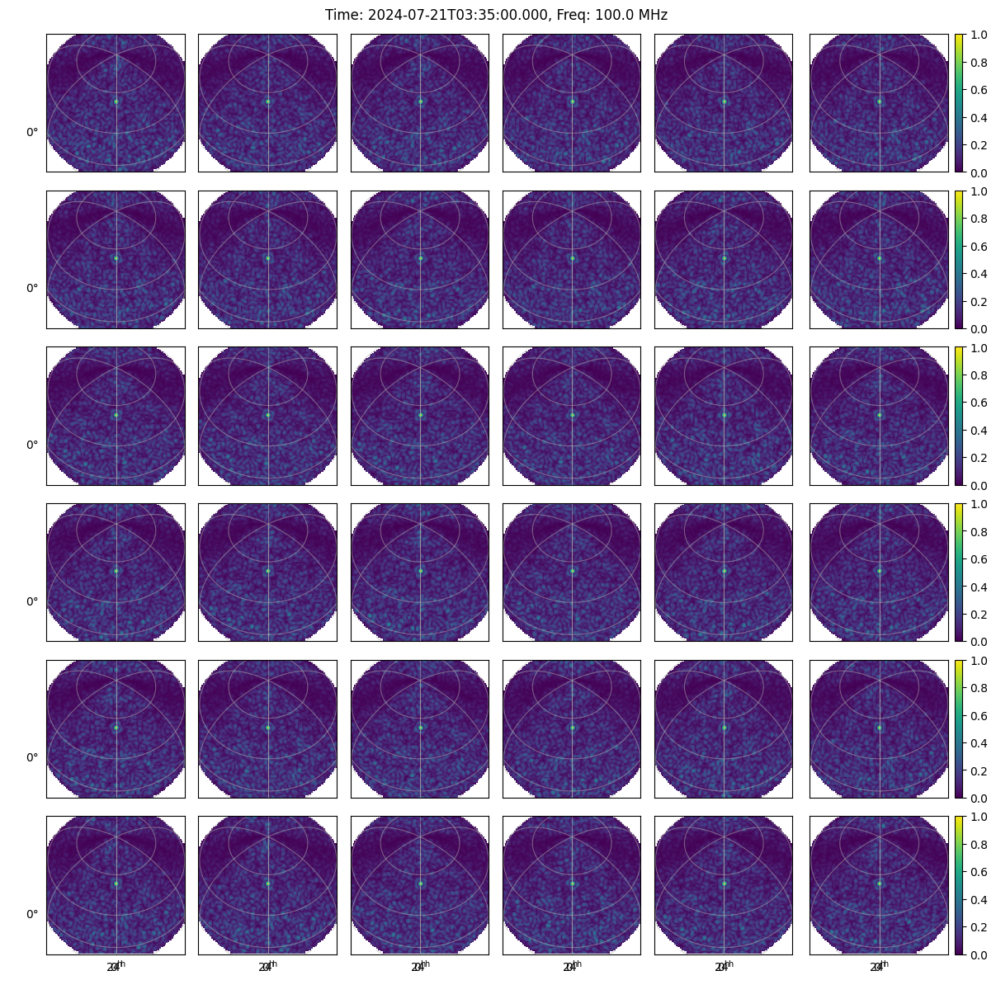

In [14]:
time_ind = 0
freq_ind = 1
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

Yup, if we switch from 50 to 100MHz the beam gets smaller on the sky, happy days.

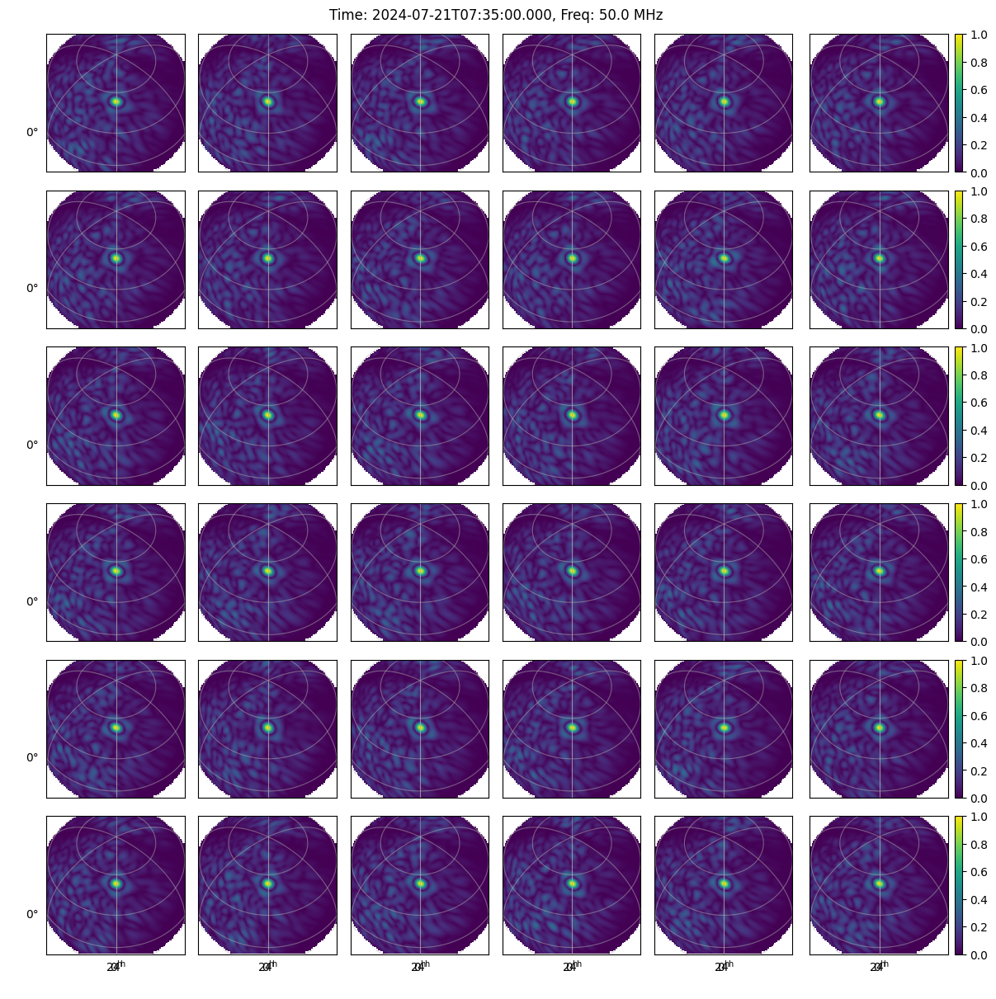

In [15]:
time_ind = 1
freq_ind = 0
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

Now we've gone from beam at zenith to 4 hours off zenith. We're still plotting with RA/Dec centred on beam, but we can see projection effects so we are defo off zenith.

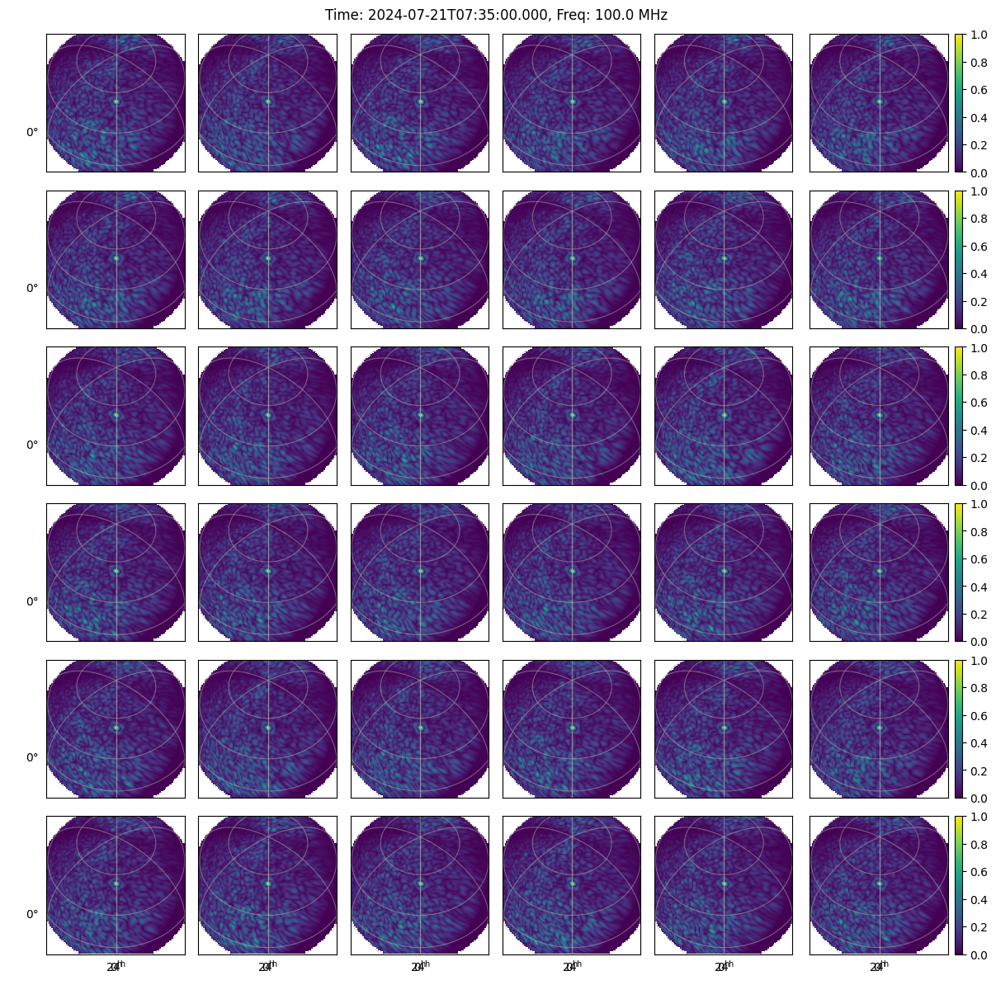

In [16]:
time_ind = 1
freq_ind = 1
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

And again changing freq changes size. Things are looking good.

## Check positions of components via image
Let's bung a grid of RA/Dec through the whole simulation code, so multiple frequencies and time steps. This should check we're calling the above beam code correctly and integrating things into the code proper.

In [17]:
from astropy.table import Column, Table

nside=11
half_width = 2

ras = np.linspace(ra0 - half_width, ra0 + half_width, nside)
decs = np.linspace(dec0 - half_width, dec0 + half_width, nside)

ras, decs = np.meshgrid(ras, decs)

ras = ras.flatten()
decs = decs.flatten()

num_comps = len(ras)

c_ids = Column(data=np.array(['source']*num_comps), name='UNQ_SOURCE_ID', dtype='|S20')
c_names = Column(data=np.array([f'source_C{i:04d}' for i in range(num_comps)]), name='NAME', dtype='|S20')

##Component position
c_ras = Column(data=ras, name='RA')
c_decs = Column(data=decs, name='DEC')

##This says we have a point source
c_comp_types = Column(data=np.array(['P']*num_comps, dtype='|S1'), name="COMP_TYPE", dtype='|S1')
##This says we have a Stokes I power-law SED
c_mod_types = Column(data=np.array(['pl']*num_comps, dtype='|S3'), name="MOD_TYPE", dtype='|S3')

##Set everything as a flat spectrum 1 Jy stokes I source. That way we can image it and see the beam pattern
c_stokes_I_ref = Column(data=np.ones(num_comps), name='NORM_COMP_PL')
c_stokes_I_SI = Column(data=np.zeros(num_comps), name='ALPHA_PL')


cols = [c_ids, c_names, c_ras, c_decs, c_comp_types, c_mod_types, c_stokes_I_ref, c_stokes_I_SI]

main_table = Table(cols)

cat_name = 'check_positions.fits'

main_table.write(cat_name, format='fits', overwrite=True)

In [ ]:
args = []

primary_beam="everybeam_LOFAR"
low_freq=50e+6
num_freq_chans=100
freq_reso=1e+4
uvfits_name=f"check_positions_{primary_beam}"

##The command to run WODEN
cmd = "run_woden.py "
cmd += f'--ra0={ra0} '
cmd += f'--dec0={dec0} '
cmd += f'--latitude={lofar_lat} '
cmd += f'--longitude={lofar_long} '
cmd += f'--date={date} '
cmd += f'--output_uvfits_prepend={uvfits_name} '
cmd += f'--cat_filename=check_positions.fits '
cmd += f'--primary_beam={primary_beam} '
cmd += f'--lowest_channel_freq={low_freq} '
cmd += f'--freq_res={freq_reso} '
cmd += f'--num_freq_channels={num_freq_chans} '
cmd += f'--band_nums=1 '
cmd += f'--time_res=10 '
cmd += f'--num_time_steps=10 '
cmd += f'--IAU_order '
cmd += f'--off_cardinal_dipoles '
cmd += '--num_threads=8 '
cmd += f'--station_id=0 '
cmd += f'--beam_ms_path=pointed_LBA.ms '

call(cmd, shell=True)

/home/jack-line/software/WODEN_dev/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')


Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful readonly open of default-locked table lba.MS/SPECTRAL_WINDOW: 14 columns, 1 rows
Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
2025-02-27 11:46:50 - INFO - 
                                              )  (              )  
                                  (  (     ( /(  )\ )        ( /(  
                                  )\))(   ')\())(()/(   (    )\()) 
                                 ((_)()\ )((_)\  /(_))  )\  ((_)\  
                                 _(())\_)() ((_)(_))_  ((_)  _((_) 
                                 \ \((_)/ // _ \ |   \ | __|| \| | 
                                  \ \/\/ /| (_) || |) || _| | .` | 
                                   \_/\_/  \___/ |___/ |___||_|\_| 
                                   
                                 You are using wodenpy version/git hash: a43c383
                                 
2025-02-27 11:46:50

2025-02-27 01:46:52	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:46:52	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:46:52	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


2025-02-27 11:46:54 - INFO - Sky set 0 has returned from the GPU after 2.5 seconds
2025-02-27 11:46:54 - INFO - Have completed 121 of 121 components calcs (100.0%)
2025-02-27 11:46:54 - INFO - Finished all rounds of processing
2025-02-27 11:46:54 - INFO - Full run took 0:00:04.100798
2025-02-27 11:46:54 - INFO - WODEN is done. Closing logging handlers. S'later


0

In [19]:
cmd = "woden_uv2ms.py "
cmd += "  --uvfits_prepend=check_positions_everybeam_LOFAR_band "
cmd += "  --band_nums=1  "

call(cmd, shell=True)

cmd = "wsclean -name check_positions_everybeam_LOFAR -size 2048 2048 -niter 2000 "
cmd += "  -auto-threshold 0.5 -auto-mask 3 "
cmd += "  -pol I -multiscale -weight briggs 0 -scale 0.002 -j 12 -mgain 0.85 "
cmd += "  -no-update-model-required "
cmd += "  check_positions_everybeam_LOFAR_band*.ms "

call(cmd, shell=True)

/home/jack-line/software/WODEN_dev/woden_dev/bin/woden_uv2ms.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.5.0')
The telescope frame is set to '????', which generally indicates ignorance. Defaulting the frame to 'itrs', but this may lead to other warnings or errors.
The uvw_array does not match the expected values given the antenna positions. The largest discrepancy is 7.191932708925151 meters. This is a fairly common situation but might indicate an error in the antenna positions, the uvws or the phasing.
The uvw_array does not match the expected values given the antenna positions. The largest discrepancy is 7.191932708925151 meters. This is a fairly common situation but might indicate an error in the antenna positions, the uvws or the phasing.
Writing in the MS file that the units of the data are uncalib, although some CASA process will ignore this and assum


WSClean version 3.4 (2023-10-11)
This software package is released under the GPL version 3.
Author: André Offringa (offringa@gmail.com).

No corrected data in first measurement set: tasks will be applied on the data column.
=== IMAGING TABLE ===
       # Pol Ch JG ²G FG FI In Freq(MHz)
| Independent group:
+-+-J- 0  I   0  0  0  0  0  0  50-51 (100)
Reordering check_positions_everybeam_LOFAR_band01.ms into 1 x 1 parts.
Reordering: 0%....10%....20%....30%....40%....50%....60%....70%....80%....90%....100%
Initializing model visibilities: 0%....10%....20%....30%....40%....50%....60%....70%....80%....90%....100%
 == Constructing PSF ==
Precalculating weights for Briggs'(0) weighting...
Opening reordered part 0 spw 0 for check_positions_everybeam_LOFAR_band01.ms
Detected 62.7 GB of system memory, usage not limited.
Opening reordered part 0 spw 0 for check_positions_everybeam_LOFAR_band01.ms
Determining min and max w & theoretical beam size... DONE (w=[0.000267848:104.927] lambdas, maxuvw=1

0

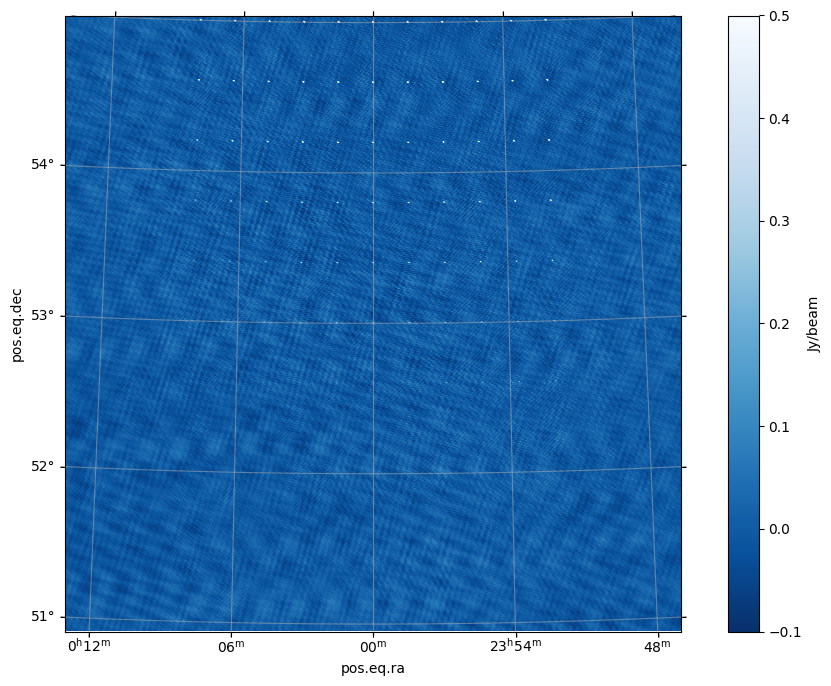

In [20]:

with fits.open('check_positions_everybeam_LOFAR-image.fits') as hdu:
    image = np.squeeze(hdu[0].data)
    wcs = WCS(hdu[0].header).celestial
    
fig, axs = plt.subplots(1, 1, figsize=(12, 8), subplot_kw={'projection': wcs})

im = axs.imshow(image, origin='lower', cmap='Blues_r', vmin=-0.1, vmax=0.5)
plt.colorbar(im, ax=axs, label='Jy/beam')

# half_width = 600

# axs.set_xlim(1024-half_width, 1024+half_width)
# axs.set_ylim(1024-half_width, 1024+half_width)

plt.grid(alpha=0.5)

plt.show()

Fairly ratty image, but we defo have a grid of point source aligned with the celestial sphere, so we're looking fine. I think `lba.MS` is a minimal example of the LBA array so the $uv$ coverage probably isn't great. Actually we can have a look at that:

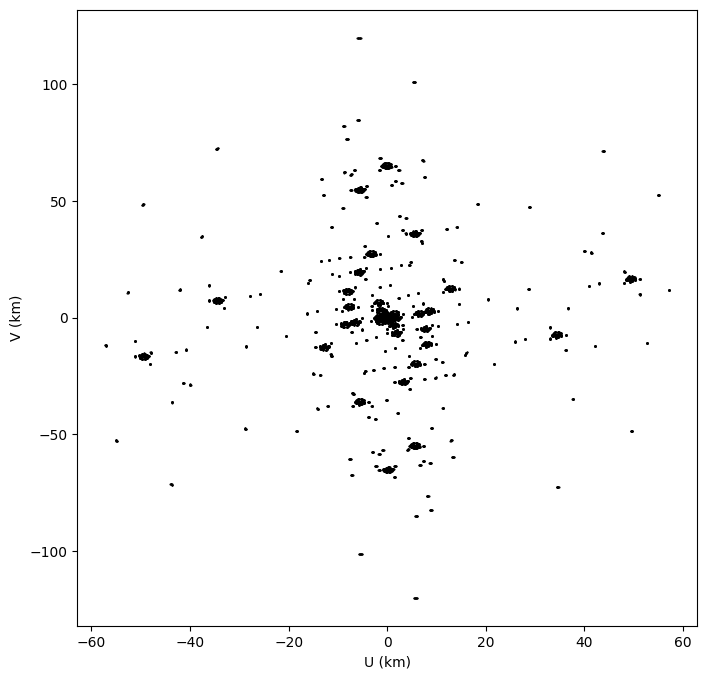

In [24]:
with fits.open('check_positions_everybeam_LOFAR_band01.uvfits') as hdu:
    uu = (hdu[0].data['UU']*c)/1e+3
    vv = (hdu[0].data['VV']*c)/1e+3
    
fig, axs = plt.subplots(1, 1, figsize=(8, 8))
axs.plot(uu, vv, 'k.', ms=1)
axs.plot(-uu, -vv, 'k.', ms=1)
axs.set_xlabel('U (km)')
axs.set_ylabel('V (km)')

plt.show()

Yeah pretty patchy coverage. Amazing resolution though, blimey!

## LoBES vs Hamaker Beams
`WODEN` has been written to default to the `hamaker` beam model for `LOFAR`, but `EveryBeam` also has a `LOBES` beam model. I've defaulted to `hamaker` for the following reasons. First up, we'll plot just the element response, a.k.a just the dipole response as given by the two models for a particular station. We'll switch off parallactic rotation and normalisation to see what the raw element response is.

First up, `hamaker`:

Thread 0 processing coords 0 to 1250Thread 1 processing coords 1250 to 2500

Thread 3 processing coords 3750 to 5000Thread 2 processing coords 2500 to 3750Thread 4 processing coords 5000 to 6250

Thread 5 processing coords 6250 to 7500Thread 6 processing coords 7500 to 8750

Thread 7 processing coords 8750 to 10000

Thread 3 finishedThread 2 finished

Thread 0 finishedThread 7 finished

Thread 1 finishedThread 5 finished

Thread 6 finished
Thread 4 finished


2025-02-27 01:50:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:50:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:50:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.
2025-02-27 01:50:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 01:50:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 01:50:00	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


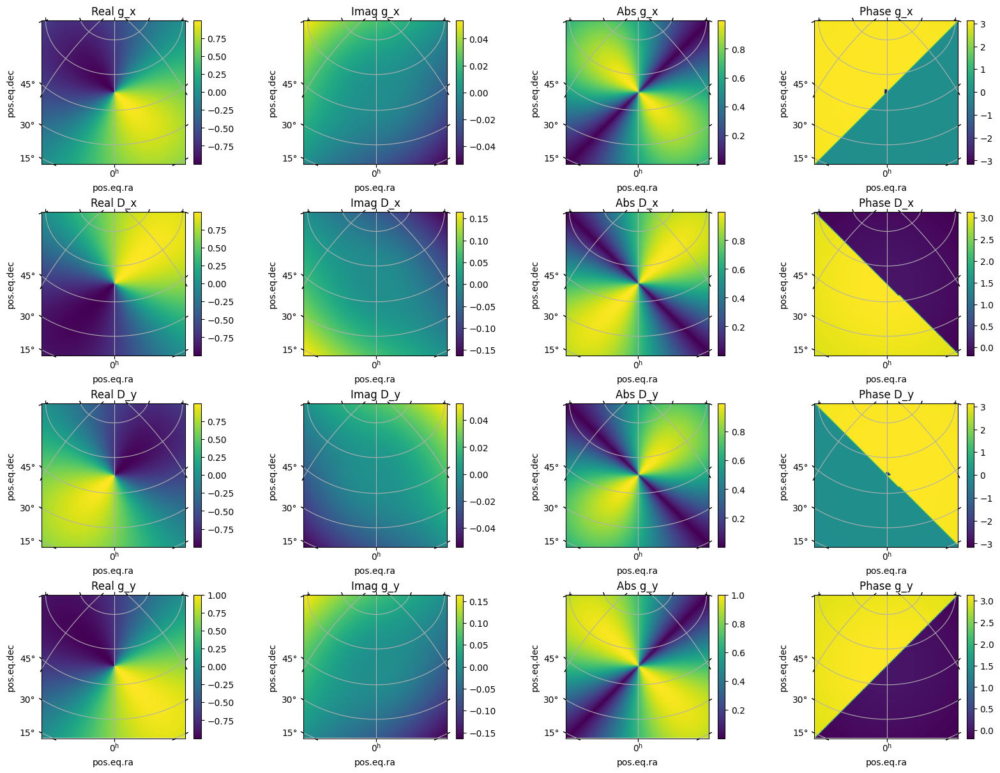

In [22]:
##setup coords
nside = 100
radec_reso = 60 / nside
header, wcs = create_WCS(ra0, dec0, nside, radec_reso)
x_mesh, y_mesh = np.meshgrid(np.arange(nside), np.arange(nside))
ras, decs = wcs.all_pix2world(x_mesh, y_mesh, 0)
ras = np.radians(ras.flatten())
decs = np.radians(decs.flatten())

##Path to example MS
ms_path="pointed_LBA.ms"

freq = 50e+6
station_id = 0

##Technically we don't need to do this here, but in WODEN proper, we
##precess the array back to J2000 rather than precessing the sky forward
##So doing it here to show you what is happening under the hood
mjd_current = observing_time.mjd
lst_J2000, latitude_J2000 = RTS_Precess_LST_Lat_to_J2000(np.radians(LST_deg),
                                                         np.radians(lofar_lat),
                                                         mjd_current)

##Stick all our variables in lists as `run_everybeam` is designed to be
## run over multiple times/frequencies
j2000_latitudes = [latitude_J2000]
j2000_lsts = [lst_J2000]
times = [observing_time]
freqs = [freq]
station_ids = [20]
##Everybeam doesn't need a coeff path for this beam
coeff_path=""

##We'll run EveryBeam in parallel to speed things up
num_threads=8

all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            times, freqs, station_ids,
                            apply_beam_norms=False,
                            iau_order=False,
                            parallactic_rotate=False,
                            element_only=True,
                            element_response_model='hamaker')

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

Just looking at the absolute values of the gains, we can see that we have two different dipoles, aligned north-east to south-west, and north-west to south-east. This all makes sense.

Now let's plot the `LOBES` beam model:

Thread 1 processing coords 1250 to 2500Thread 0 processing coords 0 to 1250Thread 3 processing coords 3750 to 5000Thread 2 processing coords 2500 to 3750



Thread 5 processing coords 6250 to 7500Thread 4 processing coords 5000 to 6250Thread 6 processing coords 7500 to 8750


Thread 7 processing coords 8750 to 10000
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.


2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.


2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.


2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)	Leap second table TAI_UTC seems out-of-date.
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	Until the table is updated (see the CASA documentation or your system admin),
2025-02-27 03:26:46	SEVERE	MeasTable::dUTC(Double) (file ./measures/Measures/MeasTable.cc, line 4292)+	times and coordinates derived from UTC could be wrong by 1s or more.


Thread 5 finished
Thread 0 finished
Thread 1 finished
Thread 4 finished
Thread 6 finished
Thread 7 finished
Thread 2 finished
Thread 3 finished


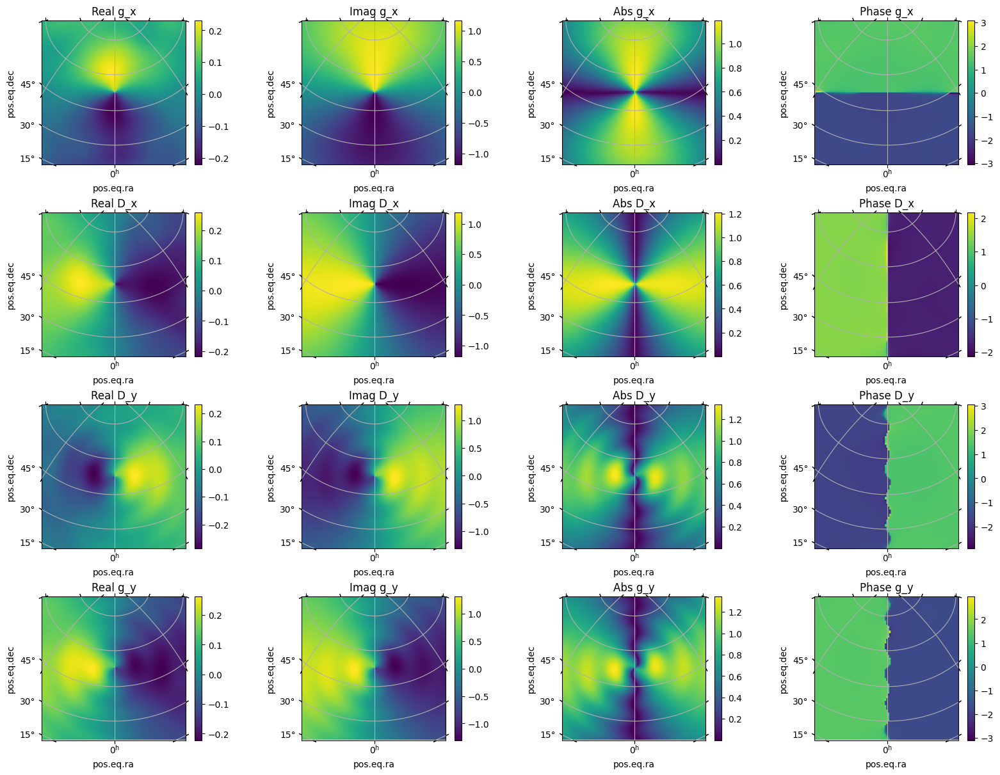

In [33]:

station_ids = [20]

all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            times, freqs, station_ids,
                            apply_beam_norms=False,
                            iau_order=False,
                            parallactic_rotate=False,
                            element_only=True,
                            element_response_model='lobes')

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

No matter how I run it, I always seem to get an error saying "LOBESElementResponse for station CS017LBA failed", so it defaults to Hamaker anyways. Aside from the fact that the elements now seem to be aligned north-south and east-west, three of the jones matrix elements seem to be aligned north-south, and only one east-west. I think `EveryBeam` might handle the whole 45 deg difference between `hamaker` and `LOBES` internally when you ask it to apply parallactic rotation(?). 

Either way I can't get a sensible answer when calling `LoBES` so I'll leave that up to a future human to work out (hopefully a LOFAR expert).